# 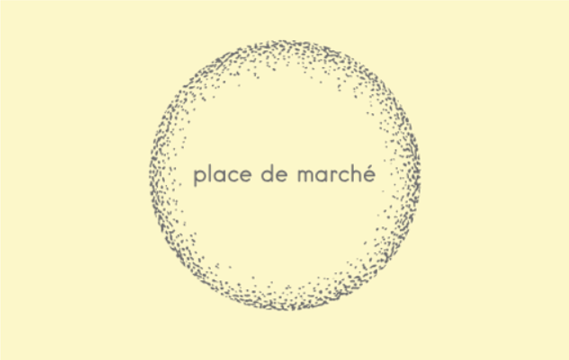

<h1><center>P6 - AUTOMATIC CLASSIFICATION OF CONSUMER GOODS</center></h1>

### OVERVIEW

"Place de marché" is a company about to launch an e-commerce marketplace. Purpose is simple: sellers offer items to buyers by posting a photo and description.

The assignment of an item's category is currently done manually by sellers and is therefore unreliable. On top of that, the number of articles is quite limited at this time.

To make the sellers experience (making it easier to put new items online) and buyers one (making it easier to find products) as smooth as possible and to be able to expand in the future, it becomes necessary to 'automate' this task.

Linda, lead data scientist, therefore asked me to study the feasibility of an engine for classifying articles into different categories, with a sufficient level of precision.

### DATA

Linda provided us with a first dataset containing items with an associated description and a link to download the picture of any item.

### OBJECTIVE

Our goal is to carry out a preliminary feasibility study of an automated content classification engine based a picture and a text description. Any additional item should be ultimately automatically allocated to a category.

### HOW

* Dataset analysis
* Products description and pictures preprocessing
* Dimension reduction
* Clustering

Results will be presented in 2D and will show us that extracted characteristics enable us to gather products from the same category together.

Graphical representation will be key to convince Linda that our modeling approach is suitable for her problem.

### SPECIFIED RULES

An implementation of SIFT / ORB / SURF algorithm is at least required to extract features.
A CNN Transfer Learning algorithm can be used if proved to be of valuable interest.

## PART 2: IMAGE CLASSIFICATION

In [1]:
# ! usr/bin/env python 3
# coding: utf-8

# Importing librairies
import os
import time
import warnings
import numpy as np               # numerical data processing
import pandas as pd              # numerical tables & time series
import scipy as sp
import scipy.stats as st         # statistical functions
import seaborn as sns            # statistical data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.collections import LineCollection
import plotly.express as px

# Clustering library
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
import hdbscan
from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer

from IPython.display import HTML
from IPython.display import Image
import re

# metrics and scoring
from sklearn import cluster, metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import homogeneity_score
from sklearn.metrics import completeness_score
from sklearn.metrics import v_measure_score
from sklearn.metrics.cluster import fowlkes_mallows_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.metrics import accuracy_score 

# Image processing
import PIL
from PIL import Image, ImageOps, ImageFilter
import cv2
from scipy.spatial import distance
from tensorflow import keras 
from tensorflow.keras.preprocessing import image

palette = sns.color_palette("bright", 10)
plot_kwds = {'alpha' : 1, 's' : 60, 'linewidths':0}
warnings.filterwarnings('ignore')

from importlib import reload
from functions_images import*
# reload(functions_images.py)
# PEP8 compliance
# %load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off

All functions run in this notebook can be found at: functions_images.py

In [2]:
start_time = time.time()

## Dataset overview

In [3]:
# Data path file
directory = "C:/Users/steph/Documents/Formation Data Scientist/P6_Lanchec_Stephane/"
# Transforming our input files.csv 
data = pd.read_csv("data_cleaned.csv")

In [4]:
data.head()

,Unnamed: 0,product_name,brand,image,product_category_tree,description,product_specifications,prod_category1
0,0,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>...",Key Features of Elegance Polyester Multicolor ...,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
1,1,Sathiyas Cotton Bath Towel,Sathiyas,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Specifications of Sathiyas Cotton Bath Towel (...,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care
2,2,Eurospa Cotton Terry Face Towel Set,Eurospa,64d5d4a258243731dc7bbb1eef49ad74.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Key Features of Eurospa Cotton Terry Face Towe...,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care
3,3,SANTOSH ROYAL FASHION Cotton Printed King size...,SANTOSH ROYAL FASHION,d4684dcdc759dd9cdf41504698d737d8.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of SANTOSH ROYAL FASHION Cotton P...,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing
4,4,Jaipur Print Cotton Floral King sized Double B...,Jaipur Print,6325b6870c54cd47be6ebfbffa620ec7.jpg,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",Key Features of Jaipur Print Cotton Floral Kin...,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing


### IMAGES

In [5]:
path = 'Images/'
data['image_dir'] = [path + row for row in data['image']]

In [6]:
data = data[['image', 'image_dir', 'prod_category1']]
data

,image,image_dir,prod_category1
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Images/d4684dcdc759dd9cdf41504698d737d8.jpg,Home Furnishing
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Images/6325b6870c54cd47be6ebfbffa620ec7.jpg,Home Furnishing
...,...,...,...
1045,958f54f4c46b53c8a0a9b8167d9140bc.jpg,Images/958f54f4c46b53c8a0a9b8167d9140bc.jpg,Baby Care
1046,fd6cbcc22efb6b761bd564c28928483c.jpg,Images/fd6cbcc22efb6b761bd564c28928483c.jpg,Baby Care
1047,5912e037d12774bb73a2048f35a00009.jpg,Images/5912e037d12774bb73a2048f35a00009.jpg,Baby Care
1048,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Images/c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,Baby Care


In [7]:
categories = data["prod_category1"]

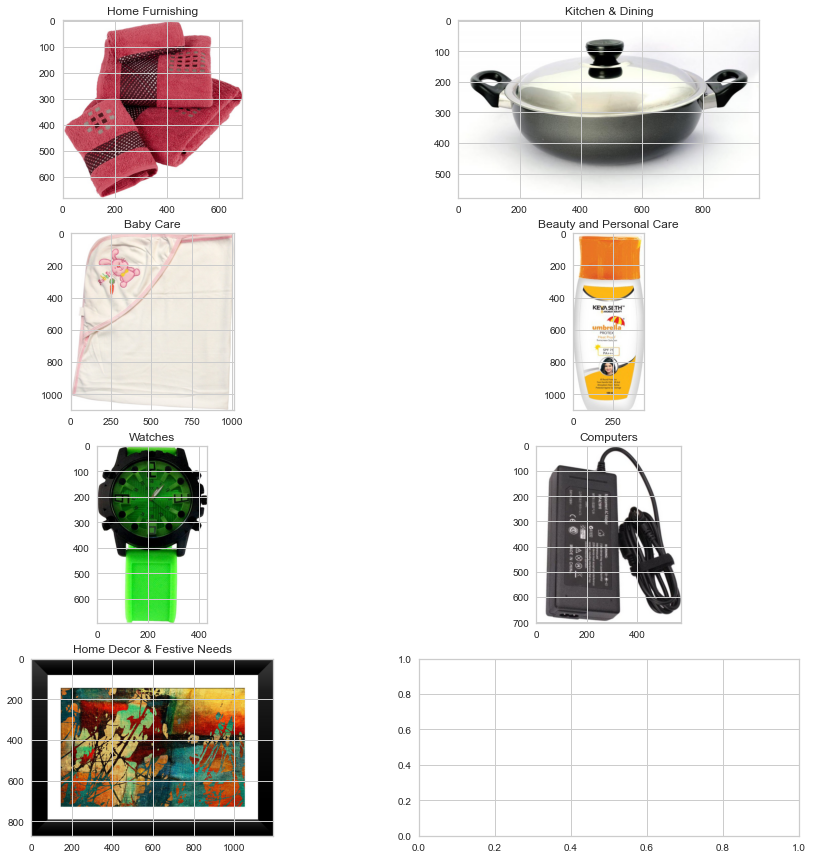

In [8]:
# Exemple of products from each category
fig, ax = plt.subplots(4, 2)
fig.set_figheight(15)
fig.set_figwidth(15)
for i, kind in enumerate(categories.unique()) :
    name_image = data[categories == kind]["image"].iloc[100]
    img = plt.imread(directory + "Images/" + name_image)
    ax[i%4, i//4].set_title(kind)
    ax[i%4, i//4].imshow(img)
  
plt.show()

Processing steps:

* Resizing in 224 * 224
* RGB conversion in grayscale (Sift)
* Noise reduction
* Histogram equalization

In [9]:
# Column creation: Width of images
data['width'] = [PIL.Image.open(row).size[0] for row in data['image_dir']]
# Column creation: Height of images
data['height'] = [PIL.Image.open(row).size[1] for row in data['image_dir']]
# Column creation: Size of images
data['size'] = [(PIL.Image.open(row).size[0] * PIL.Image.open(row).size[1])
                      for row in data['image_dir']]

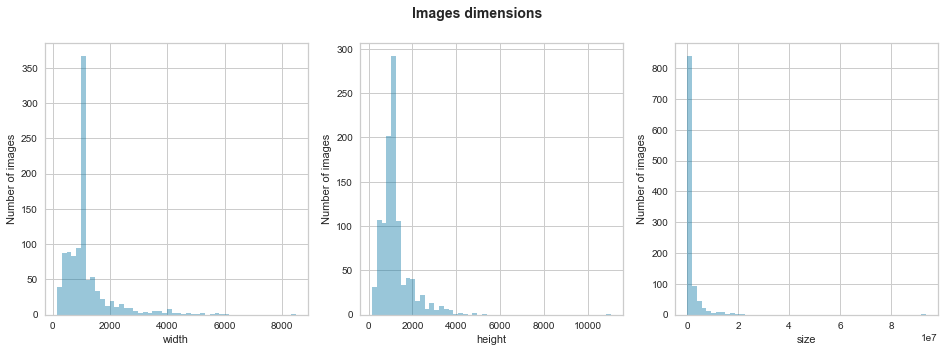

In [10]:
fig, axes =plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("Images dimensions", fontsize=18, weight = 'bold', size = 14)

sns.distplot(data['width'], kde=False, ax=axes[0])
axes[0].set_ylabel("Number of images")
sns.distplot(data['height'], kde=False, ax=axes[1])
axes[1].set_ylabel("Number of images")
sns.distplot(data['size'], kde=False, ax=axes[2])
axes[2].set_ylabel("Number of images")

plt.show()

In [11]:
# Images format
data['Format'] = [PIL.Image.open(row).mode for row in data['image_dir']]
data.groupby('Format').count()

,image,image_dir,prod_category1,width,height,size
Format,,,,,,
RGB,1050,1050,1050,1050,1050,1050


### PIL

#### Image Test

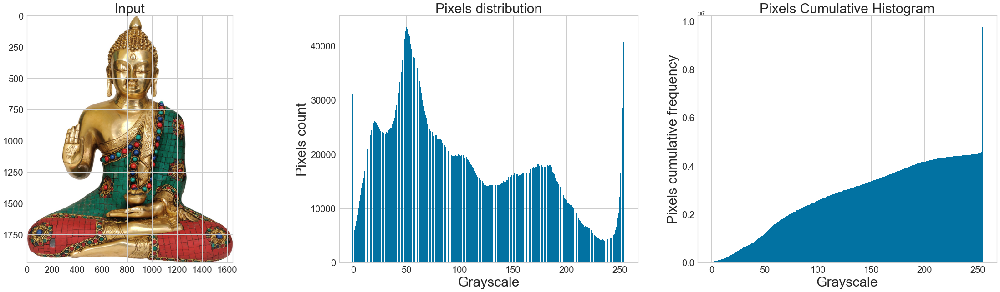

In [12]:
title = 'Input'
image = data['image_dir'][95]
img = PIL.Image.open(image)
display_pixelhist(img, title)

#### Histogram stretching

Histogram stretching involves modifying the brightness (intensity) values of pixels in the image according to some mapping function that specifies an output pixel brightness value for each input pixel brightness value.

ImageOps.autocontrast() method maximizes (normalize) image contrast. This function calculates a histogram of the input image, removes cutoff percent of the lightest and darkest pixels from the histogram, and remaps the image so that the darkest pixel becomes black (0), and the lightest becomes white (255).

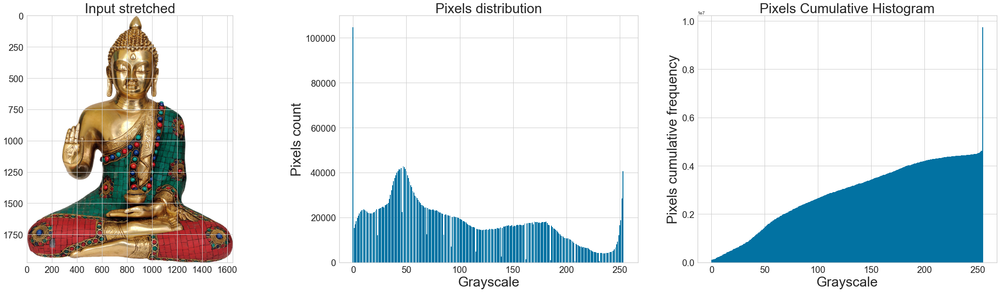

In [13]:
# # applying autocontrast method PIL
title = 'Input stretched'
img_corr = PIL.ImageOps.autocontrast(img, 1)
display_pixelhist(img_corr, title)

#### Histogram equalization

Histogram equalization is a basic image processing technique that adjusts the global contrast of an image by updating the image histogram’s pixel intensity distribution. Doing so enables areas of low contrast to obtain higher contrast in the output image.

Essentially, histogram equalization works by:

* Computing a histogram of image pixel intensities<br>
* Evenly spreading out and distributing the most frequent pixel values (i.e., the ones with the largest counts in the histogram)<br>


The result of applying histogram equalization is an image with higher global contrast.

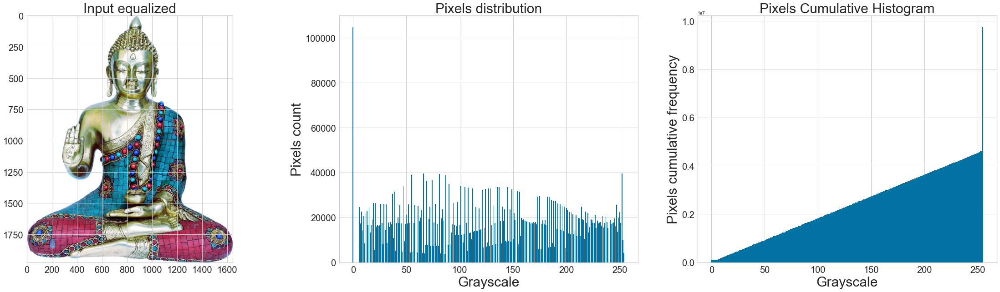

In [14]:
# Histogram equalization through PIL
title = 'Input equalized'
img_equ_pils = ImageOps.equalize(img_corr)
display_pixelhist(img_equ_pils, title)

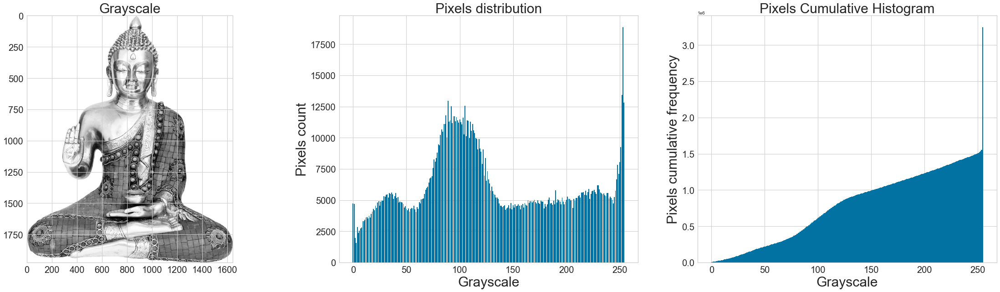

In [15]:
# applying grayscale method
title = 'Grayscale'
gray_image = ImageOps.grayscale(img_equ_pils)
display_pixelhist(gray_image, title)

### OpenCv

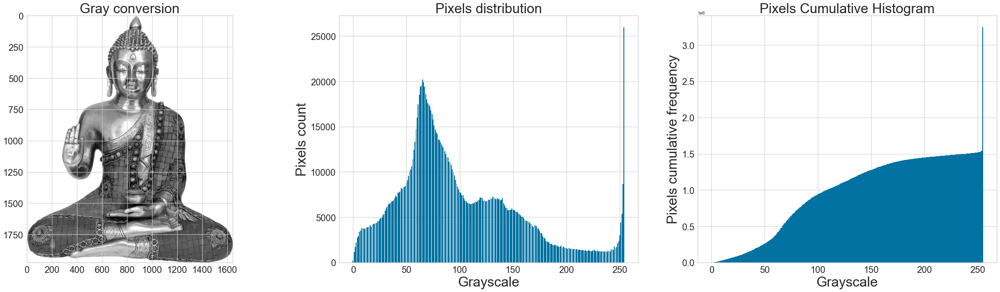

In [16]:
# Using cv2.COLOR_BGR2GRAY color space
# conversion code
title = 'Gray conversion'
gray = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)
display_pixelhist(gray, title)

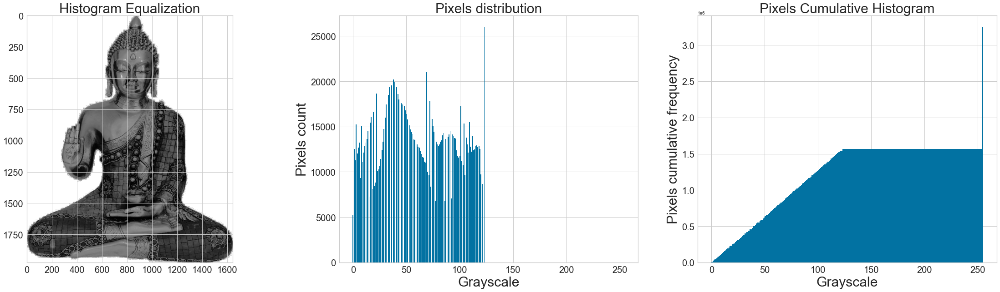

In [17]:
# Opencv Histogram Equalization
title = 'Histogram Equalization'
img_opencv_he = cv2.equalizeHist(gray)
display_pixelhist(img_opencv_he, title)

The input image’s contrast has improved significantly but at the expense of also boosting the contrast of the noise in the input image.

### Adaptive Histogram Equalization

CLAHE is a variant of Adaptive histogram equalization (AHE) which takes care of over-amplification of the contrast. CLAHE operates on small regions in the image, called tiles, rather than the entire image. The neighboring tiles are then combined using bilinear interpolation to remove the artificial boundaries. 
This algorithm can be applied to improve the contrast of images.
We supply two parameters to cv22.createCLAHE:<br>

* clipLimit: This is the threshold for contrast limiting<br>
* tileGridSize: Divides the input image into M x N tiles and then applies histogram equalization to each local tile

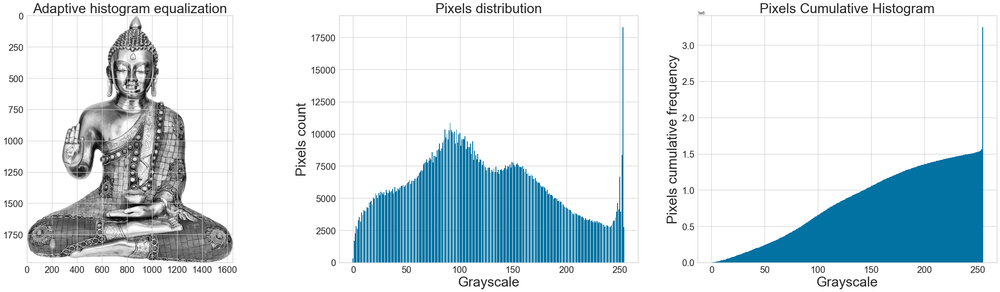

In [18]:
# Opencv Adaptive Histogram Equalization (CLAHE)
title = 'Adaptive histogram equalization'
# gray = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)
img_opencv_clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
equalized_clahe = img_opencv_clahe.apply(gray)
display_pixelhist(equalized_clahe, title)

### Redimensioning

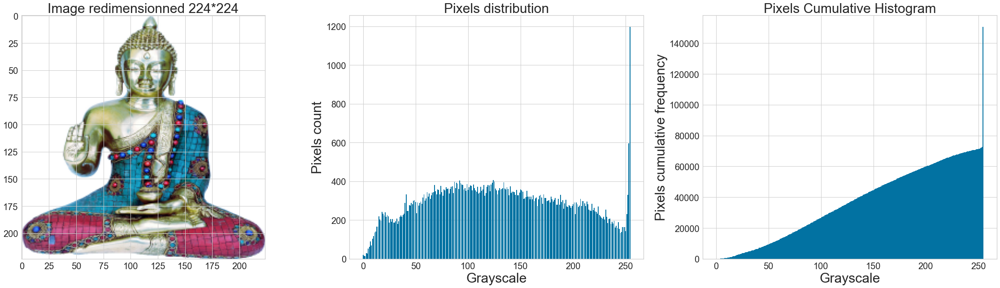

In [19]:
title = 'Image redimensionned 224*224'
dim = (224, 224)
img_pils_dim = cv2.resize(np.array(img_equ_pils), dim,
                            interpolation=cv2.INTER_AREA)
display_pixelhist(img_pils_dim, title)

### Noise reduction

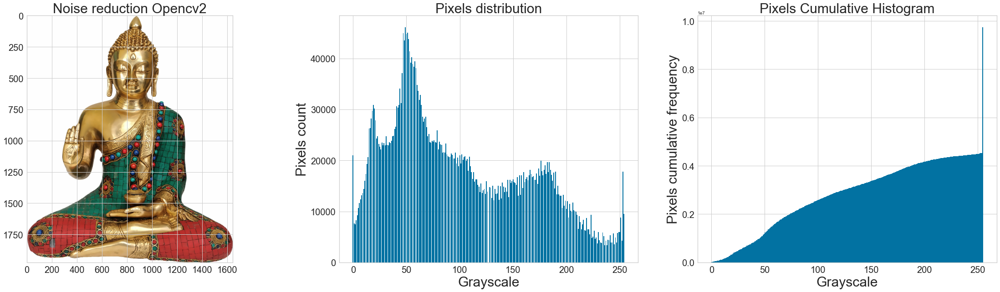

In [20]:
title = 'Noise reduction Opencv2'
denoise = cv2.fastNlMeansDenoisingColored(np.array(img),None,5,5,7,21)
display_pixelhist(denoise, title)


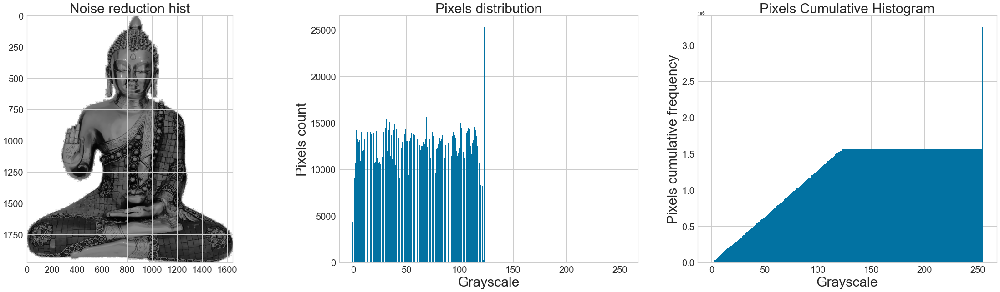

In [21]:
title = 'Noise reduction hist'
img_noise_he = cv2.fastNlMeansDenoising(img_opencv_he, None, 5, 7, 21)
display_pixelhist(img_noise_he, title)

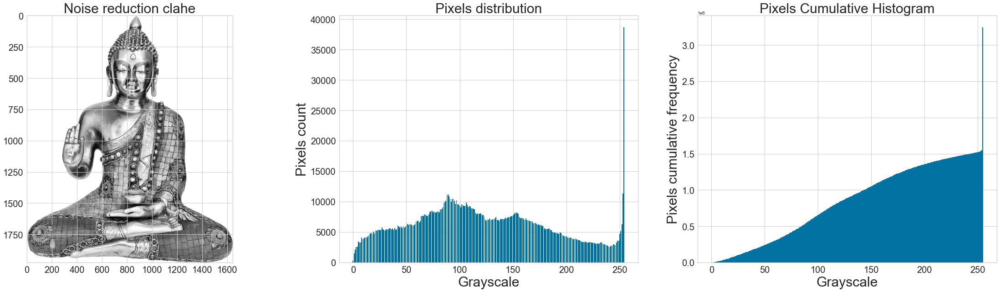

In [22]:
title = 'Noise reduction clahe'
img_noise_clahe = cv2.fastNlMeansDenoising(equalized_clahe, None, 5, 7, 21)
display_pixelhist(img_noise_clahe, title)

#### Gaussian Blur

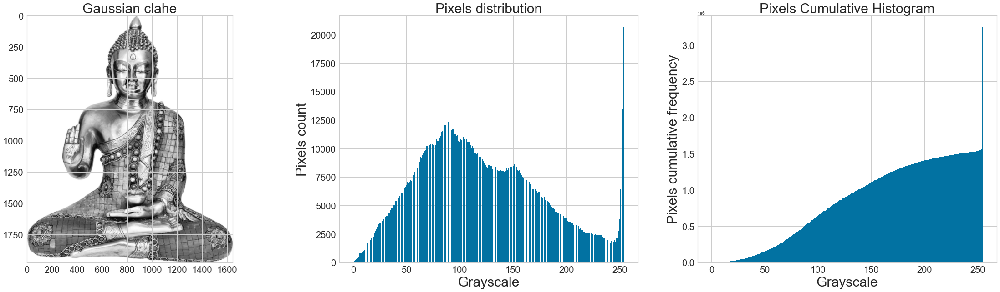

In [23]:
title = 'Gaussian clahe'
img_gaus_clahe = cv2.GaussianBlur(equalized_clahe, (5, 5), cv2.BORDER_DEFAULT)
display_pixelhist(img_gaus_clahe, title)

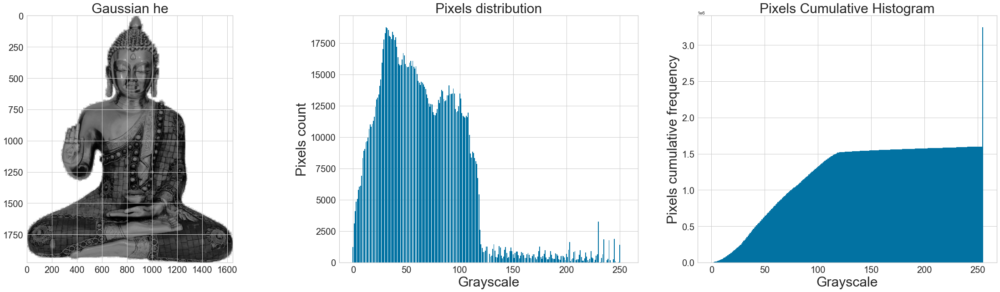

In [24]:
title = 'Gaussian he'
img_gaus_he = cv2.GaussianBlur(img_opencv_he, (5, 5), cv2.BORDER_DEFAULT)
display_pixelhist(img_gaus_he, title)

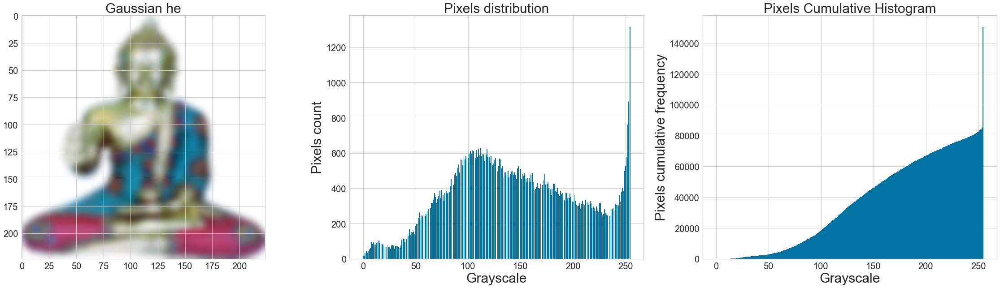

In [25]:
img_pils_dim_rgb = Image.fromarray(img_pils_dim, 'RGB')
img_gaus_pils = img_pils_dim_rgb.filter(ImageFilter.GaussianBlur(radius=3))
display_pixelhist(img_gaus_pils, title)

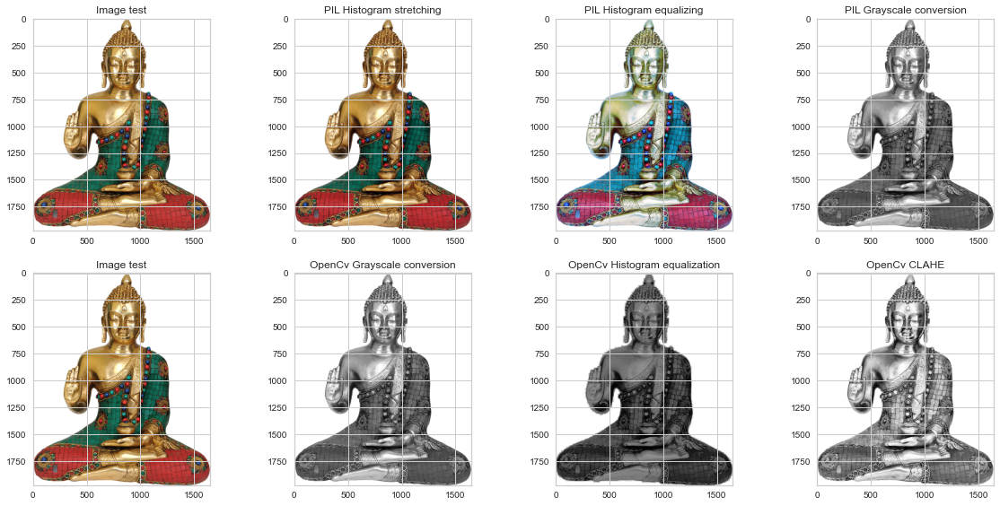

In [26]:
# Pre-processing Part 1

fig = plt.figure(figsize=(20, 20))

ax = fig.add_subplot(441)
ax.imshow(img)
plt.title('Image test')

ax = fig.add_subplot(442)
ax.imshow(img_corr)
plt.title('PIL Histogram stretching')

ax = fig.add_subplot(443)
ax.imshow(img_equ_pils)
plt.title('PIL Histogram equalizing')

ax = fig.add_subplot(444)
ax.imshow(gray, cmap='Greys_r')
plt.title('PIL Grayscale conversion')

ax = fig.add_subplot(445)
ax.imshow(img)
plt.title('Image test')

ax = fig.add_subplot(446)
ax.imshow(gray, cmap='Greys_r')
plt.title('OpenCv Grayscale conversion')

ax = fig.add_subplot(447)
ax.imshow(img_opencv_he, cmap='Greys_r')
plt.title('OpenCv Histogram equalization')

ax = fig.add_subplot(448)
ax.imshow(equalized_clahe, cmap='Greys_r')
plt.title('OpenCv CLAHE')
plt.show()

### Applying preprocessing to all images

In [27]:
st = time.time()
data['image_processed'] = data.loc[:,'image_dir'].apply(preprocessed_image)
et = time.time() - st
print('Running time (s) of clusters selection:', et)

Running time (s) of clusters selection: 941.2033550739288


In [28]:
data.head(3)

,image,image_dir,prod_category1,width,height,size,Format,image_processed
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing,3600,3600,12960000,RGB,Images_processed/55b85ea15a1536d46b7190ad6fff8...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care,2388,1293,3087684,RGB,Images_processed/7b72c92c2f6c40268628ec5f14c6d...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care,982,729,715878,RGB,Images_processed/64d5d4a258243731dc7bbb1eef49a...


### Scale Invariant Feature Transform (SIFT)

SIFT, or Scale Invariant Feature Transform, is a feature detection algorithm in Computer Vision.

SIFT helps locate the local features in an image, commonly known as the ‘keypoints‘ of the image. These keypoints are scale & rotation invariant that can be used for various computer vision applications, like image matching, object detection, scene detection, etc.

<div style="width:100%;text-align: center;"> <img align=middle src="https://media.geeksforgeeks.org/wp-content/uploads/20200517234610/C5BBC774-8499-4561-BDF6-D8D2499773F3-1024x323.png" alt="Heat beating" style="height:250px;margin-top:3rem;"> </div><br>

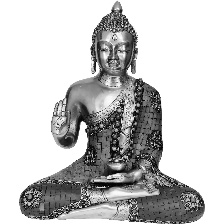

In [29]:
image_pro = data['image_processed'][95]
img = PIL.Image.open(image_pro)
img

In [30]:
# img in numpy array
img = np.array(img)
# SIFT initialization
sift = cv2.SIFT_create()
# Keypoints & descriptors
sift_kp, sift_descr = sift.detectAndCompute(img, None)
nb_feat = sift_descr.shape[0]
nb_descr = sift_descr.shape[1]
print(f'SIFT - Features={nb_feat} for {nb_descr} descriptors')

SIFT - Features=327 for 128 descriptors


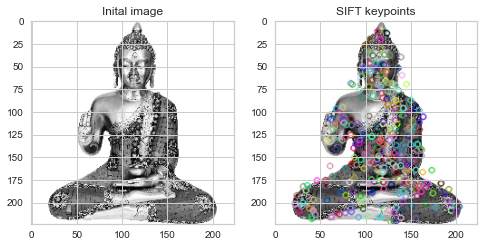

In [31]:
# Keypoints focus
sift_img_kp = cv2.drawKeypoints(img, sift_kp, None)

plt.figure(figsize=(8, 4))

# Initial Image
plt.subplot(1, 2, 1)
plt.title('Inital image')
plt.imshow(img, cmap='Greys_r')

# Image with SIFT keypoints
plt.subplot(1, 2, 2)
plt.imshow(sift_img_kp)
plt.title('SIFT keypoints')
plt.show()

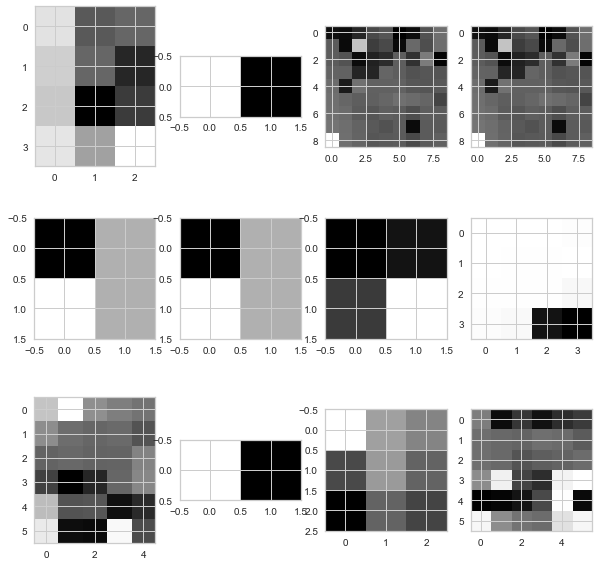

In [32]:
visual_words_display(img, sift_kp)

#### Local features from images extraction using SIFT

In [33]:
# Images loaded in dictionary
pix_dict = load_image('Images_processed')
print(f'{len(pix_dict)} images loaded')

1050 images loaded


In [35]:
# List of descriptors - All images
sifts = sift_features_out(pix_dict)

# Takes the descriptor list 
descriptor_list = sifts[0] 
# Takes the sift features
all_bovw_feature = sifts[1] 

print('Total number of descriptors:', len(descriptor_list))
print('Total number of vectors per image:', len(all_bovw_feature))

Total number of descriptors: 246659
Total number of vectors per image: 1050


#### Selection of optimal number of clusters for Kmeans

In [37]:
cluster_optimal(descriptor_list)

Running time (s) of clusters selection: 33.32407760620117


In [38]:
# Creation of a dict to keep the different metrics
metrics = {"ssel": ssel,
           "dbl": dbl,
           "chl": chl}

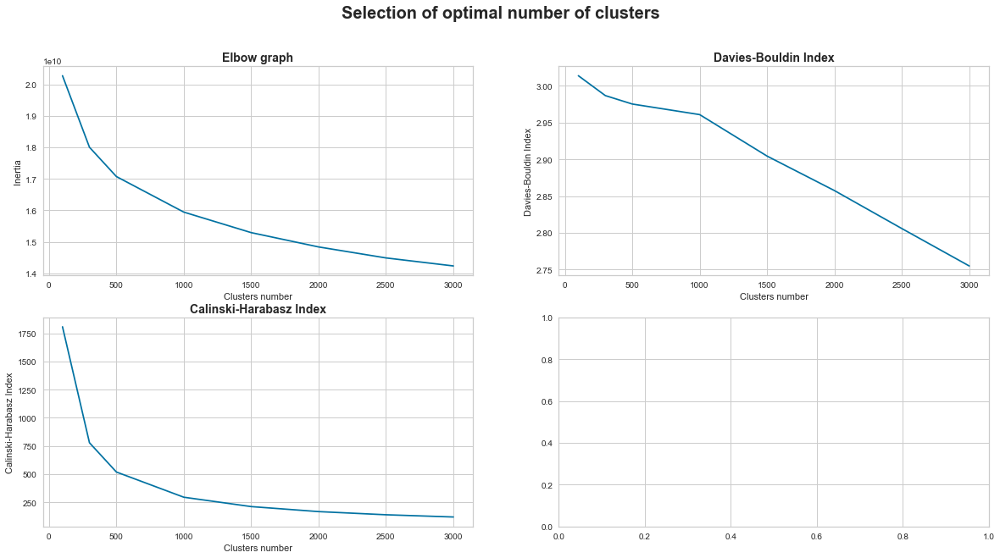

In [39]:
cluster_selection(nb_clusters, metrics)

#### Kmeans with optimal K

In [40]:
# Takes the central points which is visual words    
visual_words = sift_orb_kmeans(1000, descriptor_list)

In [41]:
print(visual_words.shape)

(1000, 128)


#### Create histograms for images

In [42]:
# Creates histograms for dataset
start_time = time.time()
bovw_train = image_class(all_bovw_feature, visual_words) 
end_time = time.time() - start_time
print('Running Time for histograms creation (s):', end_time)

Running Time for histograms creation (s): 2349.9009432792664


In [43]:
# SIFT BOVW in dataframe
df_bovw_sift = pd.DataFrame({'image': bovw_train.keys(),
                             'bovw_sift': bovw_train.values()})

# BOVW added as np.array of a list
df_bovw_sift['histogram'] = [row[0] for row in df_bovw_sift['bovw_sift']]
# Category added
df_bovw_sift = df_bovw_sift.merge(data[['image', 'image_dir',
                                        'prod_category1']], how='left',
                                  on='image')
df_bovw_sift.head(3)

,image,bovw_sift,histogram,image_dir,prod_category1
0,009099b1f6e1e8f893ec29a7023153c4.jpg,"[[0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 4.0, 0.0, 0.0,...","[0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 4.0, 0.0, 0.0, ...",Images/009099b1f6e1e8f893ec29a7023153c4.jpg,Watches
1,0096e89cc25a8b96fb9808716406fe94.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",Images/0096e89cc25a8b96fb9808716406fe94.jpg,Kitchen & Dining
2,00cbbc837d340fa163d11e169fbdb952.jpg,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",Images/00cbbc837d340fa163d11e169fbdb952.jpg,Home Furnishing


In [44]:
vectors = np.column_stack(df_bovw_sift['histogram'].values.tolist())
dataframe_vecteurs = pd.DataFrame(vectors).T
dataframe_vecteurs.head(3)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.0,1.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Display histogram of test image

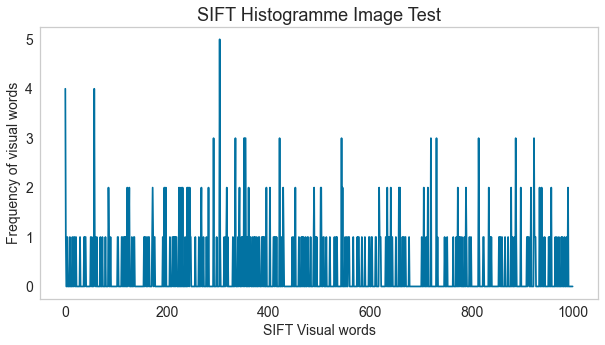

In [45]:
# Histogram of the Test image
df_visu = df_bovw_sift[df_bovw_sift['image'] ==
                       'f4d4c2eec77732f56e47722d7a355f2b.jpg']['bovw_sift']
histogram_test = df_visu.to_list()[0][0]
plt.figure(figsize=(10, 5))
plt.title('SIFT Histogramme Image Test', fontsize=18)
plt.xlabel("SIFT Visual words", fontsize=14)
plt.ylabel("Frequency of visual words", fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(False)
plt.plot(histogram_test)
plt.show()

### TSNE Dimension Reduction

In [46]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=1500, random_state=42)
tsne_results_1 = tsne.fit_transform(dataframe_vecteurs)
    
tsne_bovw = pd.concat([pd.DataFrame(tsne_results_1), data['prod_category1']], axis=1)
tsne_bovw = tsne_bovw.rename(columns={'prod_category1':'Category'})

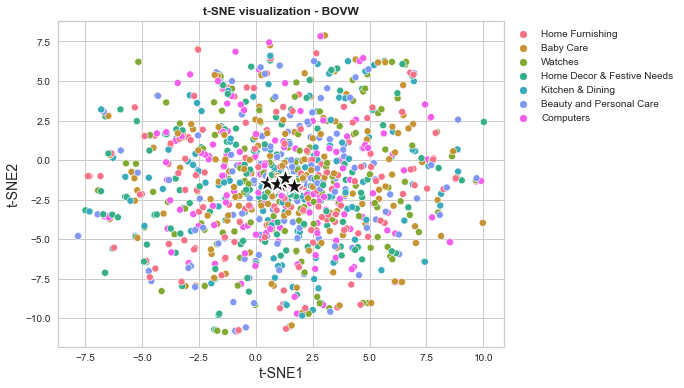

In [47]:
title = 't-SNE visualization - BOVW'
tsne_visualisation(tsne_bovw, title)

#### Kmeans clustering with optimal K

In [48]:
data_type = 'SIFT_t-SNE'

In [49]:
# KMeans initialization
kmeans_tsne_sift = KMeans(n_clusters=7,
                                 init='k-means++',
                                 random_state=42).\
                                 fit(tsne_bovw.iloc[:, :2])

tsne_bovw['cluster'] = kmeans_tsne_sift.labels_
cluster_labels = kmeans_tsne_sift.labels_
centres_reduced = kmeans_tsne_sift.cluster_centers_

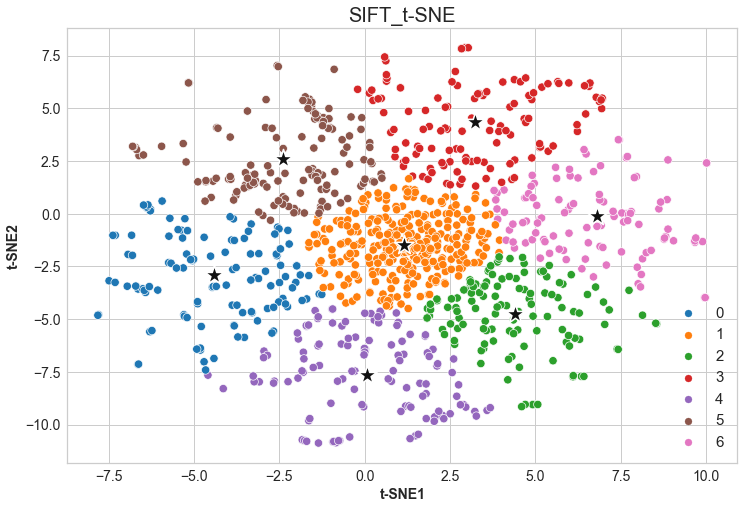

In [50]:
display_clusters_tsne(tsne_results_1, cluster_labels, centres_reduced, data_type)

#### 3D Visualization

In [51]:
tsne_3d = TSNE(n_components=3, perplexity=30, n_iter=1500, random_state=42)
sift_3d_tsne = pd.DataFrame(tsne_3d.fit_transform(dataframe_vecteurs))

# # Kmeans
kmeans_sift_3d_tsne = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(sift_3d_tsne.iloc[:, :3])
sift_3d_tsne['cluster'] = kmeans_sift_3d_tsne.labels_
cluster_labels_3d = kmeans_sift_3d_tsne.labels_
centres_reduced_3d = kmeans_sift_3d_tsne.cluster_centers_

In [52]:
threed_clustering(sift_3d_tsne)

Number of products per cluster:
1    299
5    140
2    127
0    126
3    124
4    123
6    111
Name: cluster, dtype: int64


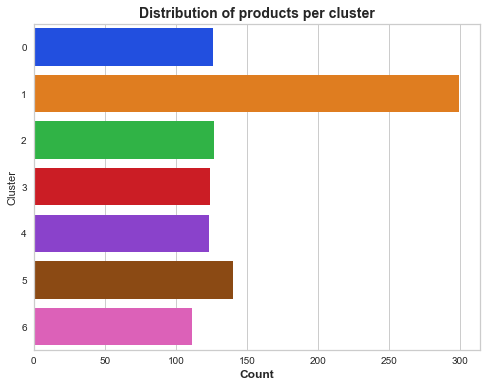

In [53]:
cluster_distribution(tsne_bovw)

In [54]:
# Categories into clusters
tsne_bovw.groupby('cluster')['Category'].value_counts().to_frame()

Category
cluster Category                            
0       Home Decor & Festive Needs        29
        Home Furnishing                   23
        Kitchen & Dining                  16
        Watches                           16
        Beauty and Personal Care          15
        Baby Care                         14
        Computers                         13
1       Beauty and Personal Care          50
        Computers                         49
        Kitchen & Dining                  45
        Watches                           43
        Baby Care                         42
        Home Furnishing                   37
        Home Decor & Festive Needs        33
2       Computers                         23
        Baby Care                         22
        Watches                           20
        Home Furnishing                   18
        Home Decor & Festive Needs        17
        Kitchen & Dining                  14
        Beauty and Personal Care          13
3       Beauty and Personal Care          23
        Watches                           21
        Home Decor & Festive Needs        20
        Baby Care                         19
        Kitchen & Dining                  16
        Home Furnishing                   14
        Computers                         11
4       Beauty and Personal Care          22
        Watches                           21
        Kitchen & Dining                  18
        Home Decor & Festive Needs        17
        Home Furnishing                   16
        Computers                         15
        Baby Care                         14
5       Computers                         26
        Baby Care                         23
        Kitchen & Dining                  23
        Home Furnishing                   22
        Home Decor & Festive Needs        19
        Watches                           15
        Beauty and Personal Care          12
6       Home Furnishing                   20
        Kitchen & Dining                  18
        Baby Care                         16
        Beauty and Personal Care          15
        Home Decor & Festive Needs        15
        Watches                           14
        Computers                         13

In [55]:
# tSNE + SIFT on images 
results_sift_tsne = metrics_clusters(tsne_bovw, data_type)
results_sift_tsne

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,SIFT_t-SNE,0.000763,0.009803,0.010161,0.009979,0.000914,0.154177


### VGG16

VGG16 is a convolution neural net (CNN ) architecture which was used to win ILSVR(Imagenet) competition in 2014. It is considered to be one of the excellent vision model architecture till date. Most unique thing about VGG16 is that instead of having a large number of hyper-parameter they focused on having convolution layers of 3x3 filter with a stride 1 and always used same padding and maxpool layer of 2x2 filter of stride 2. It follows this arrangement of convolution and max pool layers consistently throughout the whole architecture. In the end it has 2 FC(fully connected layers) followed by a softmax for output. The 16 in VGG16 refers to it has 16 layers that have weights. This network is a pretty large network and it has about 138 million (approx) parameters.

<div style="width:100%;text-align: center;"> <img align=middle src="https://miro.medium.com/max/940/1*3-TqqkRQ4rWLOMX-gvkYwA.png" alt="Heat beating" style="height:400px;margin-top:3rem;"> </div><br>

In [56]:
# Pre-trained VGG16 on raw images
# VGG16 imports

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image

# List
vgg16_all_features = []

# Model initialization
model_vgg16 = VGG16(weights='imagenet', include_top=False)
# Summary of the model
model_vgg16.summary()

for image_tar in data['image_dir']:

    # 224×224 pixels required size
    img = image.load_img(image_tar, target_size=(224, 224))
    
    # NumPy array creation
    img = image.img_to_array(img)
    # Redimensioning
    img = np.expand_dims(img, axis=0)
    # to adequate the image to the format the model requires
    img = preprocess_input(img)

    # Predictions
    vgg16_feature = model_vgg16.predict(img)
    vgg16_all_features.append(np.array(vgg16_feature).flatten())

vgg16_all_features = np.array(vgg16_all_features)

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [57]:
# BOVW VGG16
# Features to images
data['vgg16_bovw'] = \
    [vgg16_all_features[i] for i in range(data.shape[0])]
# Dataframe creation
df_vgg16_bovw = \
    data[['image', 'image_dir', 'prod_category1', 'vgg16_bovw']]
# BOVW Vectors dataframe
df_vgg16_vectors = pd.DataFrame.from_records(vgg16_all_features)
df_vgg16_vectors

,0,1,2,3,4,5,6,7,8,9,...,25078,25079,25080,25081,25082,25083,25084,25085,25086,25087
0,0.000000,0.000000,0.0,0.0,11.387655,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,56.457672,0.0,0.000000,30.503441,23.302755,0.000000,0.0,0.000000,0.0
1,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
2,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,2.554688,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0
3,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,3.481686,0.0
4,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,9.846517,0.000000,0.0,0.000000,39.281593,0.000000,6.781469,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.000000,0.000000,0.0,0.0,0.000000,0.000000,69.737549,0.0,0.0,0.0,...,1.558771,1.669379,0.0,67.558273,0.000000,13.826487,0.051441,0.0,6.565472,0.0
1046,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,41.252110,0.000000,0.0,28.162775,0.000000,0.000000,0.000000,0.0,0.000000,0.0
1047,1.441925,50.186295,0.0,0.0,0.000000,3.403962,0.000000,0.0,0.0,0.0,...,12.129979,4.801550,0.0,0.000000,0.000000,19.574411,0.000000,0.0,9.010137,0.0
1048,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,88.177811,3.596512,0.0,15.649085,0.000000,0.000000,16.004759,0.0,0.000000,0.0


In [58]:
data_type = 'TSNE_VGG16'

In [59]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=1500, random_state=42)
tsne_results_vgg16 = tsne.fit_transform(df_vgg16_vectors)
    
tsne_bovw_vgg16 = pd.concat([pd.DataFrame(tsne_results_vgg16), df_vgg16_bovw['prod_category1']], axis=1)
tsne_bovw_vgg16 = tsne_bovw_vgg16.rename(columns={'prod_category1':'Category'})

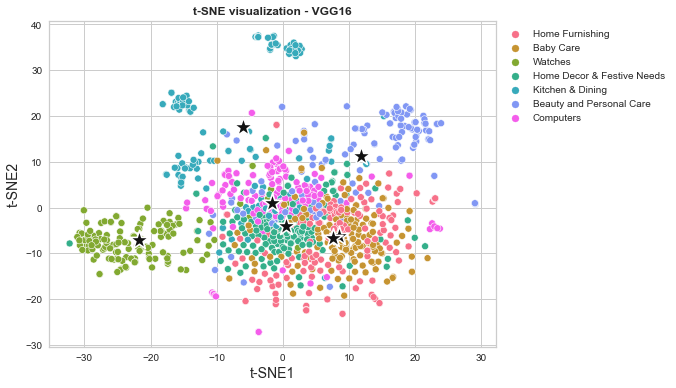

In [60]:
title = 't-SNE visualization - VGG16'
tsne_visualisation(tsne_bovw_vgg16, title)

#### KMeans clustering with optimal k

In [61]:
# KMeans initialization
kmeans_tsne_vgg16 = KMeans(n_clusters=7,
                                 init='k-means++',
                                 random_state=42).\
                                 fit(tsne_bovw_vgg16.iloc[:, :2])

tsne_bovw_vgg16['cluster'] = kmeans_tsne_vgg16.labels_
cluster_labels = kmeans_tsne_vgg16.labels_
centres_reduced = kmeans_tsne_vgg16.cluster_centers_

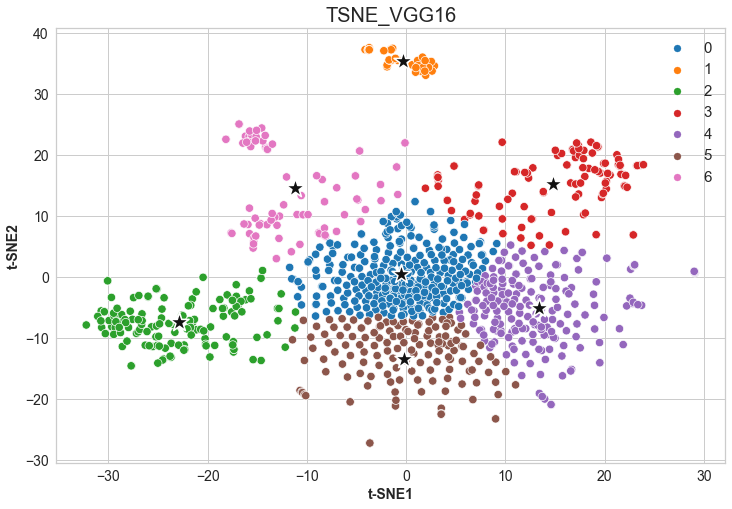

In [62]:
display_clusters_tsne(tsne_results_vgg16, cluster_labels, centres_reduced, data_type)

#### 3D Visualization

In [63]:
tsne_3d = TSNE(n_components=3, perplexity=30, n_iter=1500, random_state=42)
vgg16_3d_tsne = pd.DataFrame(tsne_3d.fit_transform(df_vgg16_vectors))

# # Kmeans
kmeans_vgg16_3d_tsne = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(vgg16_3d_tsne.iloc[:, :3])
vgg16_3d_tsne['cluster'] = kmeans_vgg16_3d_tsne.labels_
cluster_labels_3d = kmeans_vgg16_3d_tsne.labels_
centres_reduced_3d = kmeans_vgg16_3d_tsne.cluster_centers_

In [64]:
threed_clustering(vgg16_3d_tsne)

Number of products per cluster:
0    295
4    199
5    148
2    146
3    123
6     98
1     41
Name: cluster, dtype: int64


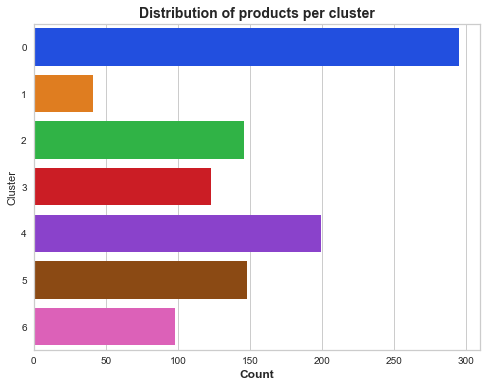

In [65]:
cluster_distribution(tsne_bovw_vgg16)

In [66]:
# tSNE + InceptionV3 on images 
results_vgg16_tsne = metrics_clusters(tsne_bovw_vgg16, data_type)
results_vgg16_tsne

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,TSNE_VGG16,0.321159,0.416735,0.445176,0.430486,0.425172,0.430834


### DBSCAN

In [67]:
X = tsne_bovw_vgg16.iloc[:, :2]

3.3598595312773916


<Figure size 360x360 with 0 Axes>

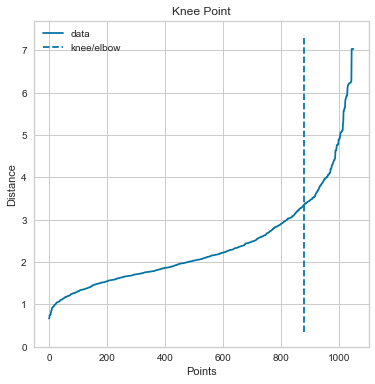

In [68]:
# Parameter tuning for eps
nearest_neighbors = NearestNeighbors(n_neighbors=12)
# rule of thumb: 2*len(X_dbscan_pca_.columns)
neighbors = nearest_neighbors.fit(X)
distances, indices = neighbors.kneighbors(X)
distances = np.sort(distances[:, 10], axis=0)
i = np.arange(len(distances))
knee = KneeLocator(i, distances, S=1,
                   curve='convex',
                   direction='increasing',
                   interp_method='polynomial')
fig = plt.figure(figsize=(5, 5))
knee.plot_knee()
plt.xlabel("Points")
plt.ylabel("Distance")
print(distances[knee.knee])

Optimal number of min_samples based on silhouette score: [22]


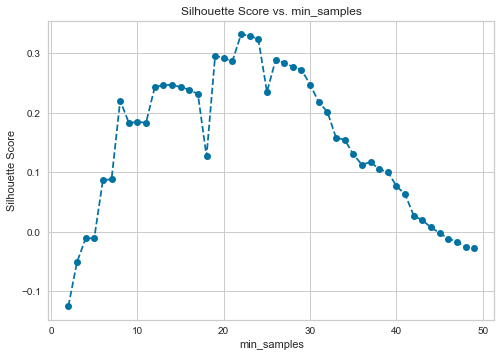

In [69]:
# Silhouette Score for DBSCAN

def get_dbscan_score(data, center):
    '''
    
    INPUT:
        data - the dataset we want to fit kmeans to
        center - the number of centers we want (the k value)
    OUTPUT:
        score - the Silhouette Score for DBSCAN
    '''
    #instantiate kmeans
    dbscan = DBSCAN(eps=eps, min_samples=center)

    # Then fit the model to our data using the fit method
    model = dbscan.fit(X)

    # Calculate Silhoutte Score

    score = silhouette_score(X, model.labels_, metric='euclidean')

    return score

eps = 3.36
scores = []
centers = list(range(2, 50))

for center in centers:
    scores.append(get_dbscan_score(X, center))

plt.plot(centers, scores, linestyle='--', marker='o', color='b');
plt.xlabel('min_samples');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score vs. min_samples');

df1_ = pd.DataFrame(centers, columns=['min_samples'])
df1_['scores'] = scores
df2_ = df1_[df1_.scores == df1_.scores.max()]
print('Optimal number of min_samples based on silhouette score:',\
      df2_['min_samples'].tolist())

Estimated number of clusters: 5
Estimated number of noise points: 227


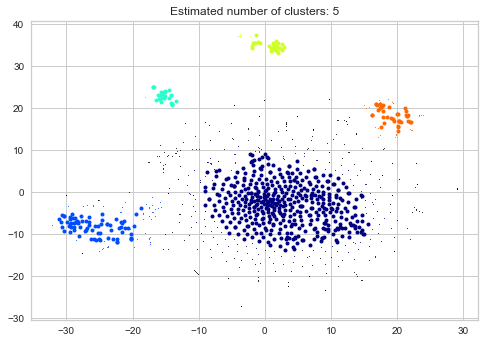

In [70]:
# Compute DBSCAN
dbs = DBSCAN(eps=3.36, min_samples=22).fit(X)
core_samples_mask = np.zeros_like(dbs.labels_, dtype=bool)
core_samples_mask[dbs.core_sample_indices_] = True
labels = dbs.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

# #############################################################################
# Plot result

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.jet(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = labels == k

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(
        xy.iloc[:, 0],
        xy.iloc[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=4)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(
        xy.iloc[:, 0],
        xy.iloc[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=1)

plt.title("Estimated number of clusters: %d" % n_clusters_)
plt.show()

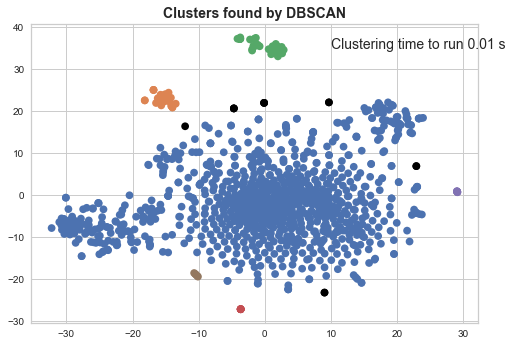

In [71]:
plot_clusters(X, cluster.DBSCAN, (), {'eps':3.36})

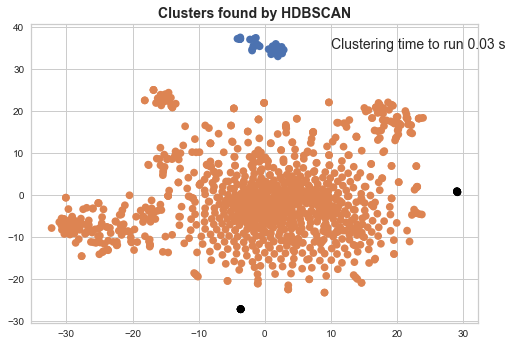

In [72]:
plot_clusters(X, hdbscan.HDBSCAN, (), {'min_cluster_size':30})

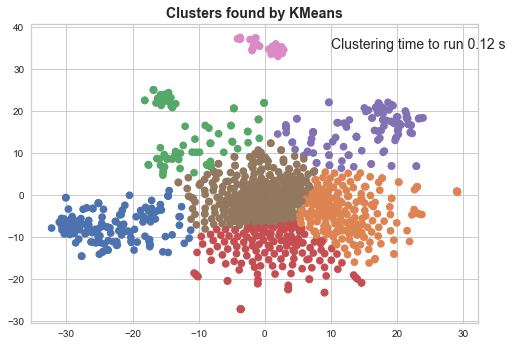

In [73]:
plot_clusters(X, cluster.KMeans, (), {'n_clusters': 7})

### INCEPTION V3

Inception v3 is a widely-used image recognition model that has been shown to attain greater than 78.1% accuracy on the ImageNet dataset. The model is the culmination of many ideas developed by multiple researchers over the years. It is based on the original paper: "Rethinking the Inception Architecture for Computer Vision" by Szegedy, et. al.

The model itself is made up of symmetric and asymmetric building blocks, including convolutions, average pooling, max pooling, concatinations, dropouts, and fully connected layers. Batch normalization is used extensively throughout the model and applied to activation inputs. Loss is computed using Softmax.

A high-level diagram of the model is shown in the following screenshot:
<div style="width:100%;text-align: center;"> <img align=middle src="https://cloud.google.com/tpu/docs/images/inceptionv3onc--oview.png" alt="Heat beating" style="height:400px;margin-top:3rem;"> </div><br>

In [92]:
# Utilisation de InceptionV3 pré-entraîné sur ImageNet avec les images
# d'origine
# InceptionV3 imports
from tensorflow import keras 
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications import InceptionV3

# Liste
incep_all_features = []

# Model initialization
model_incep = InceptionV3(weights='imagenet', include_top=False)
# Résumé de l'architecture du modèle
model_incep.summary()

for image_tar in data['image_dir']:

    # 224×224 pixels required size
    img = image.load_img(image_tar, target_size=(224, 224))
    # NumPy array
    img = image.img_to_array(img)
    # Redimensionnementing
    img = np.expand_dims(img, axis=0)
    # to adequate the image to the format the model requires
    img = preprocess_input(img)

    # Predictions
    incep_feature = model_incep.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    incep_all_features.append(np.array(incep_feature).flatten())

incep_all_features = np.array(incep_all_features)

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, None, None, 3 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, None, None, 3 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, None, None, 3 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [97]:
# Features to image
data['incep_bovw'] = \
    [incep_all_features[i] for i in range(data.shape[0])]
# Dataframe creation
df_incep_bovw = \
    data[['image', 'image_dir', 'prod_category1', 'incep_bovw']]
# BOVW dataframe InceptionV3
df_incep_vectors = pd.DataFrame.from_records(incep_all_features)
df_incep_vectors

MemoryError: 

In [98]:
data_type = 'TSNE_INCEPTIONV3'

In [99]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=1500, random_state=42)
tsne_results = tsne.fit_transform(df_incep_vectors)
    
tsne_bovw_incep = pd.concat([pd.DataFrame(tsne_results), df_incep_bovw['prod_category1']], axis=1)
tsne_bovw_incep = tsne_bovw_incep.rename(columns={'prod_category1':'Category'})
tsne_bovw_incep

,0,1,Category
0,20.137445,-3.799474,Home Furnishing
1,4.339005,-8.496393,Baby Care
2,7.771895,-15.907606,Baby Care
3,22.745768,-16.311749,Home Furnishing
4,22.466404,-14.007433,Home Furnishing
...,...,...,...
1045,21.781605,-11.123482,Baby Care
1046,-0.449556,-7.375420,Baby Care
1047,-1.158088,-8.532175,Baby Care
1048,-0.377215,-26.383581,Baby Care


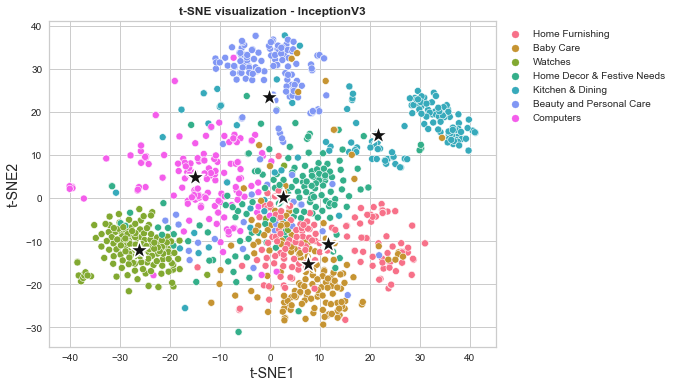

In [100]:
title = 't-SNE visualization - InceptionV3'
tsne_visualisation(tsne_bovw_incep, title)

#### KMeans clustering with optimal k

In [101]:
# KMeans initialization
kmeans_tsne_incep = KMeans(n_clusters=7,
                                 init='k-means++',
                                 random_state=42).\
                                 fit(tsne_bovw_incep.iloc[:, :2])

tsne_bovw_incep['cluster'] = kmeans_tsne_incep.labels_
cluster_labels = kmeans_tsne_incep.labels_
centres_reduced = kmeans_tsne_incep.cluster_centers_

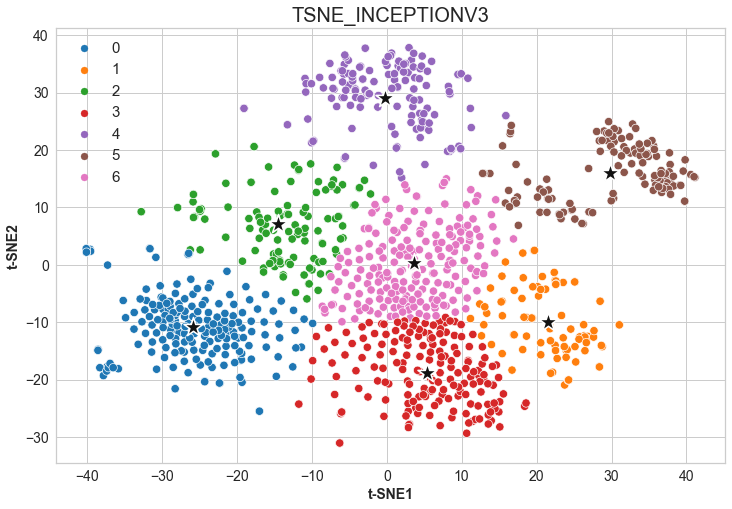

In [102]:
display_clusters_tsne(tsne_results, cluster_labels, centres_reduced, data_type)

#### 3D Visualization

In [103]:
tsne_3d = TSNE(n_components=3, perplexity=30, n_iter=1500, random_state=42)
incep_3d_tsne = pd.DataFrame(tsne_3d.fit_transform(df_incep_vectors))

# # Kmeans
kmeans_incep_3d_tsne = KMeans(n_clusters=7,
                      init='k-means++',
                      random_state=42).fit(incep_3d_tsne.iloc[:, :3])
incep_3d_tsne['cluster'] = kmeans_incep_3d_tsne.labels_
cluster_labels_3d = kmeans_incep_3d_tsne.labels_
centres_reduced_3d = kmeans_incep_3d_tsne.cluster_centers_

In [104]:
threed_clustering(incep_3d_tsne)

Number of products per cluster:
6    201
0    194
3    178
4    147
2    124
5    122
1     84
Name: cluster, dtype: int64


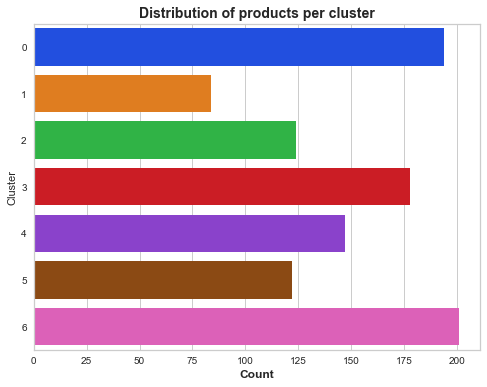

In [105]:
cluster_distribution(tsne_bovw_incep)

In [106]:
# tSNE + InceptionV3 on images 
results_incep_tsne = metrics_clusters(tsne_bovw_incep, data_type)
results_incep_tsne

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,TSNE_INCEPTIONV3,0.496208,0.553572,0.564261,0.558866,0.554861,0.570565


### Let's perform Kmeans before t-SNE

In [107]:
df_incep_vectors

,0,1,2,3,4,5,6,7,8,9,...,51191,51192,51193,51194,51195,51196,51197,51198,51199,cluster
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.337230,0.330544,0.000000,0.000000,...,0.000000,0.120970,0.684383,0.516968,2.551146,1.970356,0.992620,0.000000,0.000000,0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.421107,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.331819,0.000000,0.211539,0.000000,0.000000,0.000000,1
2,0.000000,0.000000,0.000000,0.521826,0.000000,0.036375,0.373178,0.285788,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.239291,0.094887,0.000000,0.000000,0.000000,5
3,0.000000,0.224649,0.000000,0.000000,0.000000,0.000000,0.572368,0.000000,0.000000,0.000000,...,1.377247,0.319640,0.834160,1.410929,0.139529,0.000000,0.000000,0.000000,0.624707,0
4,0.093728,0.056398,1.011427,0.000000,0.000000,0.000000,0.000000,2.293038,0.967586,0.131576,...,0.861085,0.688059,0.000000,0.235916,1.460241,0.650028,0.000000,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.575883,0.000000,0.088667,0.197679,0.000000,0.000000,0.000000,0.209605,1.192339,0.000000,...,0.000000,0.517824,0.939690,0.000000,3.462013,0.969570,1.348470,0.000000,0.493176,0
1046,0.000000,0.380566,0.000000,1.349846,0.000000,0.000000,1.086878,0.000000,0.000000,0.305535,...,4.124948,1.348152,1.585749,1.234860,0.978636,0.000000,1.102299,1.323979,0.000000,1
1047,0.000000,0.000000,1.050051,0.000000,1.840097,0.000000,0.000000,0.505276,0.138822,0.000000,...,0.000000,0.000000,0.000000,0.732064,0.000000,0.000000,3.724521,0.253865,0.173557,1
1048,1.234792,0.000000,2.381427,0.000000,0.000000,0.439964,1.192949,0.000000,0.000000,0.000000,...,0.409168,1.238223,0.000000,0.254562,0.000000,0.000000,0.000000,0.000000,0.000000,1


In [108]:
# KMeans initialization
kmeans_inceptv3 = KMeans(n_clusters=7,
                                 init='k-means++',
                                 random_state=42).\
                                 fit(df_incep_vectors)

df_incep_vectors['cluster'] = kmeans_inceptv3.labels_
cluster_labels = kmeans_inceptv3.labels_
centres_reduced = kmeans_inceptv3.cluster_centers_

In [110]:
df_incep_vectors.head(3)

,0,1,2,3,4,5,6,7,8,9,...,51191,51192,51193,51194,51195,51196,51197,51198,51199,cluster
0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.337230,0.330544,0.0,0.0,...,0.0,0.12097,0.684383,0.516968,2.551146,1.970356,0.99262,0.0,0.0,0
1,0.0,0.0,0.0,0.000000,0.0,0.421107,0.000000,0.000000,0.0,0.0,...,0.0,0.00000,0.000000,1.331819,0.000000,0.211539,0.00000,0.0,0.0,1
2,0.0,0.0,0.0,0.521826,0.0,0.036375,0.373178,0.285788,0.0,0.0,...,0.0,0.00000,0.000000,0.000000,0.239291,0.094887,0.00000,0.0,0.0,5


In [111]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=1500, random_state=42)
tsne_post = tsne.fit_transform(df_incep_vectors.loc[:, df_incep_vectors.columns != 'cluster'])

tsne_post_incep = pd.concat([pd.DataFrame(tsne_post), df_incep_bovw['prod_category1']], axis=1)
tsne_post_incep = pd.concat([pd.DataFrame(tsne_post_incep), df_incep_vectors['cluster']], axis=1)
tsne_post_incep = tsne_post_incep.rename(columns={'prod_category1':'Category'})
tsne_post_incep

,0,1,Category,cluster
0,29.092295,-8.429510,Home Furnishing,0
1,2.441356,-13.054049,Baby Care,1
2,10.527800,-14.512822,Baby Care,5
3,7.955365,-29.439013,Home Furnishing,0
4,9.381397,-27.816256,Home Furnishing,0
...,...,...,...,...
1045,10.167102,-24.962769,Baby Care,0
1046,-0.580526,-9.395424,Baby Care,1
1047,-1.086871,-11.300425,Baby Care,1
1048,16.074293,-21.205551,Baby Care,1


In [112]:
data_type = 'try'

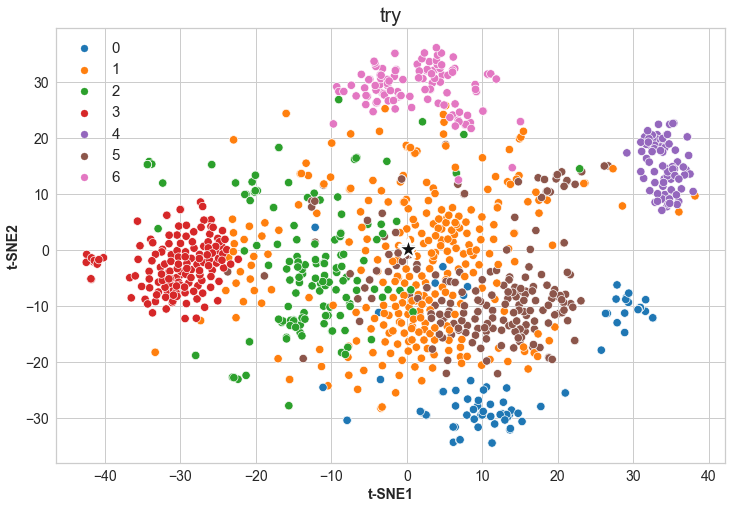

In [113]:
display_clusters_tsne(tsne_post, cluster_labels, centres_reduced, data_type)

Number of products per cluster:
1    296
5    193
2    149
3    144
6    112
0     79
4     77
Name: cluster, dtype: int64


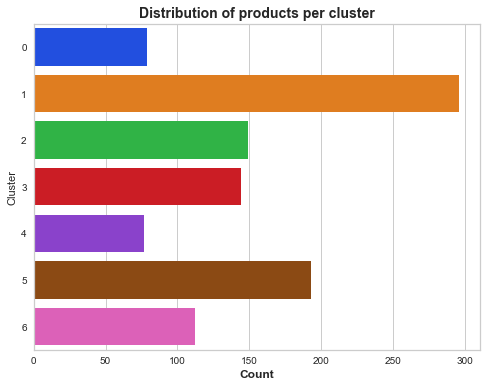

In [115]:
cluster_distribution(tsne_post_incep)

In [116]:
# KMeans + tSNE
incep_post_tsne = metrics_clusters(tsne_post_incep, data_type)
incep_post_tsne

,Methods,ARI,Homogeneity,Completness,V-Measure,AMI,Fowlkes-Mallows
0,try,0.394108,0.505623,0.53391,0.519381,0.514934,0.491325
